# EDA-Project
House prices in King County

by Marek Nowaczewski, total_impact@web.de

# Import of modules

In [1]:
import pandas as pd

import numpy as np
from scipy.special import exp10

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

# Loading data

In [2]:
df = pd.read_csv('King_County_House_prices_dataset.csv')

In [37]:
#df.info()
#print(df.columns)
#[print(i) for i in df.columns]

In [4]:
#df.head()

## The given variables

| Variable | Definition                                 | Key                                            | Type        |
|:----------|:--------------------------------------------|:------------------------------------------------|-------------|
| id | unique identified for a house                    |                                           | ordnial     |
| date       | house was sold                           |                                                | interval     |
| price     |      house price - to predict             |                                                | intervaal |
| bedrooms  | number of Bedrooms/House                  |                                                | ratio       |
| bathrooms | number of bathrooms/bedrooms              |                                                | ratio       |
| sqft_living   |       footage of the home             |                                                | ratio         |
| sqft_lot   |     footage of the lot                   |                                                | ratio     |
| floors    |   total floors (levels) in house          |                                                | ratio       |
|waterfront | object with waterfront view  |                                                | nominal     |
| view      |   object has been viewed                   |                                                |nominal |
|condition  |  how good the condition is ( Overall )    |                                                | ordinal  
| grade     |  overall grade given to the housing unit, based on King County grading system  |                                                | ordinal  
| sqft_above  | square footage of house apart from basement   |                                                | ratio  
| sqft_basement  | square footage of the basement        |                                                | ratio  
| yr_built  |    year the object was built                            |                                                | interval 
| yr_renovated  |  year when the object was renovated         |                                                | interval 
| zipcode  |      zip code                              |                                                | ordinal 
| lat      |    latitude coordinate                     |                                                | ratio 
| long     |    longitude coordinate                    |                                                | ratio 
| sqft_living15  |  square footage of interior housing living space for the nearest 15 neighbors   |                         | ratio 
| sqft_lot15  | square footage of the land lots of the nearest 15 neighbors |                                                | ratio 

## Derivate / calculated data

In [5]:
df['spec_price'] = df.price / df.sqft_living
df['lo_li_rat'] = df.sqft_lot / df.sqft_living

# Missing values

In [6]:
miss = pd.DataFrame(df.isnull().sum(), columns = ['counts'])
miss['percentage'] = np.round(miss.counts / len(df)*100, decimals = 2)
miss[miss.counts > 0]

,counts,percentage
waterfront,2376,11.00
view,63,0.29
yr_renovated,3842,17.79


## Waterfront

In [7]:

# make the waterfront variable more categorical
values = {'waterfront' : 0.5}
df.fillna(value = values, inplace = True)
df['waterfront_str'] = df.waterfront.astype(str)

In [8]:
# make the waterfront variable more categorical
values = {'waterfront' : 0.5}
df.fillna(value = values, inplace = True)
df['waterfront_str'] = df.waterfront.astype(str)

def plot_missing_water():
    global fig
    fig = px.scatter_mapbox(df[df["waterfront"]== 0.5] , lat="lat", lon="long", hover_name="id", hover_data=["price", "zipcode"],
                            color = "waterfront_str",
                            zoom=8, height=500, width = 700)
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.show()

# --end print missing water---------------------------------------------------
    
plot_missing_water()

**Conclusion** regarding the missing values of **waterfront**:

Of course the attribute of a waterview would have an influence on the price of a hoouse. Due to that the known houses with this tag should not miss it. That's why this variable **shouldn't be ignored**.
The plot above shows that the **majority** of the houses with a missing value **rather don't have a waterview**.
Setting the values to 0 the damage to the data should be rather small.
(On Vashon Island the portion of untagged watersided could be a bit higher...)


*For the moment these values are kept with a own non-null value*

## View

In [41]:
#gb_v = df.groupby('view')['price', 'sqft_living', 'grade', 'spec_price'].mean()
gb_v = df.groupby('view')['price', 'grade', 'spec_price'].mean()
gb_v['counts'] = df.groupby('view').count().id

missing_view = pd.DataFrame(df[df.view.isnull()])
gb_v.head()

,price,grade,spec_price,counts
view,,,,
0.0,4.968061e+05,7.566214,256.894200,19422
1.0,8.133733e+05,8.115152,320.076130,330
2.0,7.913904e+05,8.315569,304.420288,957
3.0,9.732852e+05,8.730315,323.027575,508
4.0,1.452466e+06,9.063091,434.540453,317


In [73]:
def plot_missing_view():
    global fig
    fig = px.scatter(missing_view, x = 'price', y = 'spec_price',
                    hover_name="id",
                    hover_data=["price", "zipcode", 'grade', 'sqft_living'],
                    color_continuous_scale=["red", "green", "blue"],
                    color = 'grade',
                    #color = 'view',
                    height=500, width = 700)
    fig.update_layout(
    xaxis_title = 'price $',
    yaxis_title = r'$\frac{USD}{ft^2}$')
    fig.show()
plot_missing_view()

**Conclusion?**

It is hard to say what to do with the misssing data of view.
The table of the gouped by view data suggest that the higher value of view means rather larger, better and expensive house.

The scatterplot above shows that the **missing values are spread** regarding some other values.
Due to that it is hard to say what should be the proceeding with these values.

*For the moment I will let them as they are. Not known yet if really needed.*

## Year renovated

In [14]:

gb_yr = df.groupby('yr_renovated').count()

missing_reno = pd.DataFrame(df[df.yr_renovated.isnull()])
not_reno = pd.DataFrame(df[df.yr_renovated == 0])
def_reno = pd.DataFrame(df[df.yr_renovated.notna()])

fig_reno = px.histogram(missing_reno, x = 'yr_built', nbins = 70)
fig_reno.update_layout(title = 'Missing values for "year renovated"', xaxis_title = 'year built')

fig_reno2 = px.histogram(not_reno, x = 'yr_built')
fig_reno2.update_layout(title = '"renovated" houses with a value', xaxis_title = 'year built')

fig_reno.show()
fig_reno2.show()


In [15]:
def_reno = def_reno[def_reno.yr_renovated != 0]
#def_reno

def plot_renovated():
    global fig
    fig = px.scatter(def_reno, x = 'yr_built', y = 'yr_renovated',
                    hover_name="id",
                    hover_data=["price", "zipcode", 'grade', 'sqft_living'],
                    color_continuous_scale=["red", "green", "blue"],
                    color = 'grade')
    fig.update_layout(
    xaxis_title = 'year built',
    yaxis_title = 'year renovated',
    title = 'renovated houses')
    fig.show()
plot_renovated()

In [16]:
print('Number of renovated houses: ' + str(len(def_reno)))
print('Percentage of renovated houses: ' + str(round((len(def_reno)/len(df))*100,2)) + '%')
print('Expected amount of renovated houses among the missing: ' 
      + str(int(miss.loc['yr_renovated']['counts']*(len(def_reno)/len(df)))))

Number of renovated houses: 744
Percentage of renovated houses: 3.44%
Expected amount of renovated houses among the missing: 132


**Conclusion**

Due to the fact that the amount of houses without a renovation is quite high respectively the amount of renovated houses is quite low (3.44 %)
With this ratio statistically about 132 houses of the missing should be renovated. 
**The missing values of these few houses could be ignored**.

So the missing values are set to 0. How to handle the value of 0 will be reviewed if neccessary.

In [17]:
values = {'yr_renovated' : 0.0}
df.fillna(value = values, inplace = True)
df['yr_renovated'] = df.yr_renovated.astype(int)

# Look on locations

The popularity say that the most important factor of the price of a house is the **location**.

Let's have a look on that.

## Map of specific prices

In [19]:
def plot_map_spec_price():
    fig = px.scatter_mapbox(df, lat="lat", lon="long", hover_name="id", hover_data=["price", "zipcode", "lo_li_rat"],
                            #color_discrete_sequence=["fuchsia"],
                            color = "spec_price",
                            color_continuous_scale=["red", "green", "blue"],
                            zoom=8,
                            height=500, width = 700)
    fig.update_layout(title = 'Map with specific prices')
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
    fig.show()

plot_map_spec_price()

It is recognizable that there is a kind of a concentic gradient of the specific prices around Seattle. 
There are some outliers a bit more far away.

Vashon Island and Maury Island seem to have an own distribution. So it should be an option to seperate this area in the way of further analysis.

## Map of zipcodes

In [21]:
def plot_map_zipcodes():
    fig = px.scatter_mapbox(df, lat="lat", lon="long", hover_name="id", hover_data=["price", "zipcode", "spec_price"],
                            #color_discrete_sequence=["fuchsia"],
                            color = "zipcode",
                            zoom=8, height=500, width = 700)
    fig.update_layout(title = 'Map of zipcodes')
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
    fig.show()
    
plot_map_zipcodes()

The plot of zipcodes suggests that the zipcode has somthing in comon with the location. 
But the location and the zipcode are not correlating at the moment. The value of the zipcode itself is no indicator. 
For exemple the codes 98001, 98002 and 98003 are located in the south near Tacoma where the prices are rether low 
but the code 98004 is located very close to the centre of Seattle with nearly the highest prices.

## Map of zipcodes by mean specific prices

In [22]:
gr_by_zip_mean = df.groupby('zipcode').mean()
gr_by_zip_mean['count'] = df.groupby(['zipcode']).count().id

In [23]:
def plot_zip_mean_spec():
    fig = px.scatter_mapbox(gr_by_zip_mean, lat="lat", lon="long", 
                        #hover_name="index",
                        color = "spec_price",
                        size = "count",
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        zoom=8, height=500, width = 700)
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(title = 'Map of zipcodes by mean specific prices')
    fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
    fig.show()

plot_zip_mean_spec()

It shows that there is a correlation between zipcodes and specific prices.

## Resorting the zipcodes
by median of spec price

In [25]:
gb_zip = df.groupby(['zipcode'])
df2 = pd.DataFrame({col:vals['spec_price'] for col, vals in gb_zip})
meds = df2.median()
meds.sort_values(ascending=False, inplace=True)
meds.index.names = ['zips']
meds = meds.to_frame()
meds.reset_index(inplace = True)

df3 = df[:]
df['ziporder'] = 0
for i in df3.zipcode.unique():
    df3.loc[df3['zipcode'] == i, 'ziporder'] = meds[meds['zips'] == i].index.values


In [26]:
def plot_box_ziporder():
    fig = px.box(df3, x = 'ziporder', y = 'spec_price')
    fig.update_layout(title = 'Boxplot of spec. prices by new ordered zipcodes')
    fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
    fig.show()
    
plot_box_ziporder()

In [27]:
df3['spec_price_log'] = np.log(df3.spec_price)

In [28]:
def plot_box_ziporder_log():
    fig = px.box(df3, x = 'ziporder', y = 'spec_price_log')
    fig.update_layout(title = 'Boxplot of log spec. prices by new ordered zipcodes')
    fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
    fig.show()
    
plot_box_ziporder_log()

# Look on correlations

In [43]:
spot = df3[:]
spot.drop(['id', 'zipcode', 'date', 'view', 'long', 'waterfront_str'], axis = 1, inplace = True)

spot.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,sqft_above,...,yr_renovated,lat,sqft_living15,sqft_lot15,spec_price,lo_li_rat,ziporder,spec_price_log,price_log,price_log10
0,221900.0,3,1.00,1180,5650,1.0,0.5,3,7,1180,...,0,47.5112,1340,5650,188.050847,4.788136,53.0,5.236712,12.309982,5.346157
1,538000.0,3,2.25,2570,7242,2.0,0.0,3,7,2170,...,1991,47.7210,1690,7639,209.338521,2.817899,27.0,5.343953,13.195614,5.730782
2,180000.0,2,1.00,770,10000,1.0,0.0,3,6,770,...,0,47.7379,2720,8062,233.766234,12.987013,39.0,5.454322,12.100712,5.255273
3,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,1050,...,0,47.5208,1360,5000,308.163265,2.551020,16.0,5.730630,13.311329,5.781037
4,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,1680,...,0,47.6168,1800,7503,303.571429,4.809524,29.0,5.715617,13.142166,5.707570


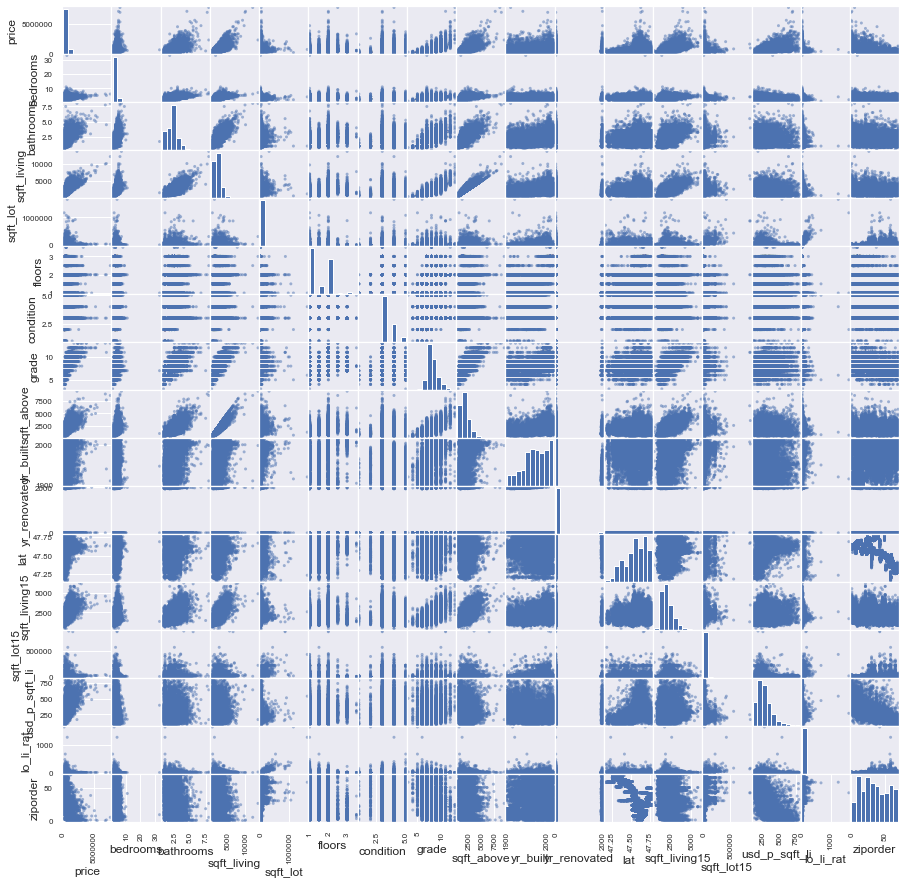

In [171]:
pd.plotting.scatter_matrix(spot, figsize=(15, 15));

In [44]:
df3['price_log'] = np.log(df3.price)
df3['price_log10'] = np.log10(df3.price)

In [45]:

corrs = spot.corr()

figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    annotation_text=corrs.round(2).values,
    showscale=True)
figure.show()

In [74]:
df3['zipcode_cat'] = df3.ziporder.astype('category')
#df3['spec_price'] = df3.usd_p_sqft_li
#df3.info()

# Regressions

In [48]:
import statsmodels.api as sms

In [49]:
X = df3[['ziporder']]
X = sms.add_constant(X)

Y = df3[['spec_price_log']]

C:\Users\User\anaconda3\envs\nf\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



In [50]:
model = sms.OLS(Y, X)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         spec_price_log   R-squared:                       0.600
Model:                            OLS   Adj. R-squared:                  0.600
Method:                 Least Squares   F-statistic:                 3.243e+04
Date:                Wed, 10 Jun 2020   Prob (F-statistic):               0.00
Time:                        09:50:47   Log-Likelihood:                -662.73
No. Observations:               21597   AIC:                             1329.
Df Residuals:                   21595   BIC:                             1345.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.0348      0.003   1757.963      0.000       6.028       6.041
ziporder      -0.0156   8.67e-05   -180.080      0.000      -0.016      -0.015
==============================================================================
Omnibus:                     1223.310   Durbin-Watson:                   1.995
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2940.173
Skew:                           0.348   Prob(JB):                         0.00
Kurtosis:                       4.668   Cond. No.                         80.1
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [51]:
#X2 = df3[['ziporder', 'sqft_living', 'grade', 'yr_built', 'long', 'condition']]
#X2 = df3[['ziporder',  'grade', 'yr_built', 'long', 'condition']]
X2 = df3[['ziporder',  'grade', 'yr_built', 'long', 'condition']]
#X2 = df3[['ziporder', 'sqft_living', 'grade', 'yr_built']]
#X2 = df3[['ziporder', 'sqft_living']]
X2 = sms.add_constant(X2)

#Y2 = df3[['spec_price']]
Y2 = df3[['price']]
#Y2 = df3[['spec_price_log']]
#Y2 = df3[['price_log']]

In [52]:
model = sms.OLS(Y2, X2)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.614
Model:                            OLS   Adj. R-squared:                  0.613
Method:                 Least Squares   F-statistic:                     6856.
Date:                Wed, 10 Jun 2020   Prob (F-statistic):               0.00
Time:                        09:51:08   Log-Likelihood:            -2.9712e+05
No. Observations:               21597   AIC:                         5.943e+05
Df Residuals:                   21591   BIC:                         5.943e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.594e+07   1.55e+06     10.261      0.000    1.29e+07     1.9e+07
ziporder   -6316.4157     89.209    -70.805      0.000   -6491.272   -6141.560
grade       2.106e+05   1593.528    132.135      0.000    2.07e+05    2.14e+05
yr_built   -1991.6761     70.648    -28.192      0.000   -2130.151   -1853.201
long        1.062e+05   1.23e+04      8.621      0.000    8.21e+04     1.3e+05
condition   3.474e+04   2567.398     13.531      0.000    2.97e+04    3.98e+04
==============================================================================
Omnibus:                    24536.959   Durbin-Watson:                   1.981
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          5780114.785
Skew:                           5.585   Prob(JB):                         0.00
Kurtosis:                      82.363   Cond. No.                     1.97e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.97e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [53]:
import statsmodels.api as sm
from sklearn.base import BaseEstimator, RegressorMixin
import pandas as pd
import numpy as np

from sklearn.utils.multiclass import check_classification_targets
from sklearn.utils.validation import check_X_y, check_is_fitted, check_array
from sklearn.utils.multiclass import unique_labels
from sklearn.utils.estimator_checks import check_estimator

from sklearn.model_selection import train_test_split


class MyLinearRegression(BaseEstimator, RegressorMixin):
    def __init__(self, fit_intercept=True):

        self.fit_intercept = fit_intercept


    """
    Parameters
    ------------
    column_names: list
            It is an optional value, such that this class knows 
            what is the name of the feature to associate to 
            each column of X. This is useful if you use the method
            summary(), so that it can show the feature name for each
            coefficient
    """ 
    def fit(self, X, y, column_names=() ):

        if self.fit_intercept:
            X = sm.add_constant(X)

        # Check that X and y have correct shape
        X, y = check_X_y(X, y)


        self.X_ = X
        self.y_ = y

        if len(column_names) != 0:
            cols = column_names.copy()
            cols = list(cols)
            X = pd.DataFrame(X)
            cols = column_names.copy()
            cols.insert(0,'intercept')
            print('X ', X)
            X.columns = cols

        self.model_ = sm.OLS(y, X)
        self.results_ = self.model_.fit()
        return self



    def predict(self, X):
        # Check is fit had been called
        check_is_fitted(self, 'model_')

        # Input validation
        X = check_array(X)

        if self.fit_intercept:
            X = sm.add_constant(X)
        return self.results_.predict(X)


    def get_params(self, deep = False):
        return {'fit_intercept':self.fit_intercept}


    def summary(self):
        print(self.results_.summary() )

In [68]:
cols = ['ziporder', 'sqft_living', 'grade', 'yr_built', 'long', 'condition']
#cols = ['ziporder', 'long']
#cols = ['ziporder']

X = df3[cols]
#X = df3[['ziporder', 'sqft_living', 'grade', 'yr_built', 'long', 'condition']]
#X2 = df3[['ziporder',  'grade', 'yr_built', 'long', 'condition']]
#X = df3[['ziporder',  'grade', 'yr_built', 'long', 'condition']]
#X = df3[['ziporder', 'sqft_living', 'grade', 'yr_built']]
#X2 = df3[['ziporder', 'sqft_living']]
#X2 = sms.add_constant(X2)

#Y2 = df3[['spec_price']]
Y = df3[['price']]
#Y2 = df3[['spec_price_log']]
Y2 = df3[['price_log']]
Y3 = df3[['price_log10']]

In [69]:

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42, shuffle=False)
X_train, X_test, y_train2, y_test2 = train_test_split(X, Y2, test_size=0.33, random_state=42, shuffle=False)
X_train, X_test, y_train3, y_test3 = train_test_split(X, Y3, test_size=0.33, random_state=42, shuffle=False)

#cols = ['ziporder', 'sqft_living', 'grade', 'yr_built', 'long', 'condition']
#X_train = df_train[cols].values
#X_test = df_test[cols].values
#y_train = df_train['price_log']
#y_test = df_test['price_log']
model = MyLinearRegression()
model.fit(X_train, y_train)
model.summary()
Y_pred1 = model.predict(X_test)

model2 = MyLinearRegression()
model2.fit(X_train, y_train2)
model2.summary()
Y_pred2 = model2.predict(X_test)

model3 = MyLinearRegression()
model3.fit(X_train, y_train3)
model3.summary()
Y_pred3 = model3.predict(X_test)

C:\Users\User\anaconda3\envs\nf\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.

C:\Users\User\anaconda3\envs\nf\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\User\anaconda3\envs\nf\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.706
Model:                            OLS   Adj. R-squared:                  0.705
Method:                 Least Squares   F-statistic:                     5775.
Date:                Wed, 10 Jun 2020   Prob (F-statistic):               0.00
Time:                        10:07:57   Log-Likelihood:            -1.9710e+05
No. Observations:               14469   AIC:                         3.942e+05
Df Residuals:                   14462   BIC:                         3.943e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -3.721e+05   1.73e+06     -0.215      0.8

C:\Users\User\anaconda3\envs\nf\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\User\anaconda3\envs\nf\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.841
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                 1.274e+04
Date:                Wed, 10 Jun 2020   Prob (F-statistic):               0.00
Time:                        10:07:57   Log-Likelihood:                 14128.
No. Observations:               14469   AIC:                        -2.824e+04
Df Residuals:                   14462   BIC:                        -2.819e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.8990      0.790     17.583      0.0

C:\Users\User\anaconda3\envs\nf\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [70]:
#size(y_train)
restore_test_price2 = np.exp(y_test2)
restore_pred_price2 = np.exp(Y_pred2)

restore_test_price3 = exp10(y_test3)
restore_pred_price3 = exp10(Y_pred3)

In [57]:
round(model.results_.rsquared,3)

0.706

Text(0.05, 0.95, 'ziporder\nsqft_living\ngrade\nyr_built\nlong\ncondition')

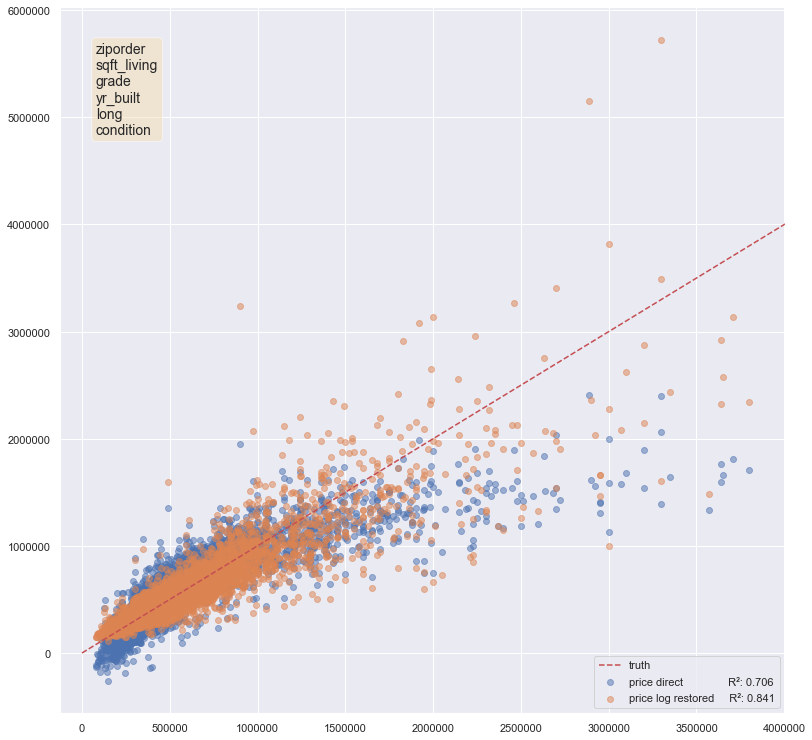

In [71]:
fig= plt.figure(figsize=(13,13))

label1 = f'price direct               R²: {round(model.results_.rsquared,3)}'
label2 = f'price log restored     R²: {round(model2.results_.rsquared,3)}'

plt.scatter(y_test, Y_pred1, alpha = 0.5, label = label1)
plt.scatter(restore_test_price2, restore_pred_price2, alpha = 0.5, label = label2)
ax = plt.gca()
x_limits = ax.get_xlim()
y_limits = ax.get_ylim()
plt.plot([0,x_limits[1]],[0,x_limits[1]], 'r--', label = 'truth')
plt.legend(loc = 'lower right')

ax.set_xlim(x_limits)
ax.set_ylim(y_limits)

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
textstr = '\n'.join(cols)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)



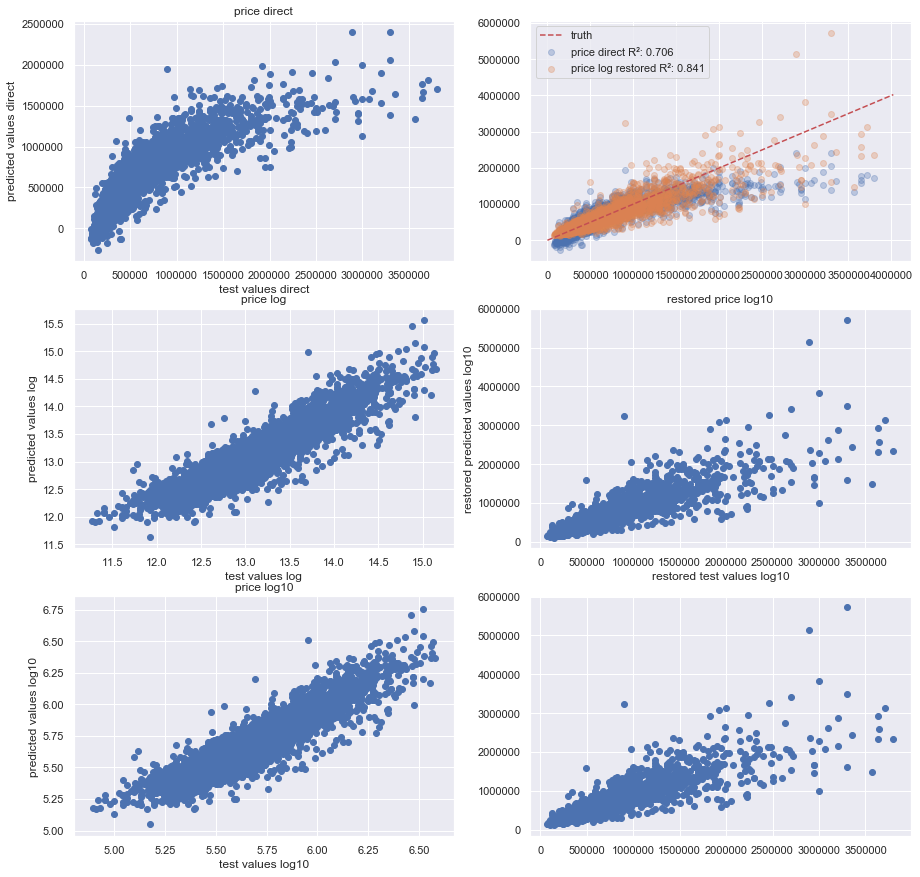

In [72]:
fig, ax = plt.subplots(3,2, figsize=(15,15))

ax[0,0].scatter(y_test, Y_pred1)
ax[1,0].scatter(y_test2, Y_pred2)
ax[2,0].scatter(y_test3, Y_pred3)

ax[1,1].scatter(restore_test_price2, restore_pred_price2)
ax[2,1].scatter(restore_test_price3, restore_pred_price3)

label1 = f'price direct R²: {round(model.results_.rsquared,3)}'
label2 = f'price log restored R²: {round(model2.results_.rsquared,3)}'

ax[0,1].scatter(y_test, Y_pred1, alpha = 0.3, label = label1)
ax[0,1].scatter(restore_test_price2, restore_pred_price2, alpha = 0.3, label = label2)

x_limits = ax[0,1].get_xlim()
y_limits = ax[0,1].get_ylim()
ax[0,1].plot([0,x_limits[1]],[0,x_limits[1]], 'r--', label = 'truth')
ax[0,1].legend()

ax[0,0].set_title('price direct');
ax[0,0].set_xlabel('test values direct');
ax[0,0].set_ylabel('predicted values direct');

ax[1,0].set_title('price log');
ax[1,0].set_xlabel('test values log');
ax[1,0].set_ylabel('predicted values log');

ax[2,0].set_title('price log10');
ax[2,0].set_xlabel('test values log10');
ax[2,0].set_ylabel('predicted values log10');

ax[1,1].set_title('restored price log');
ax[1,1].set_xlabel('restored test values log');
ax[1,1].set_ylabel('restored predicted values log');

ax[1,1].set_title('restored price log10');
ax[1,1].set_xlabel('restored test values log10');
ax[1,1].set_ylabel('restored predicted values log10');

In [343]:
x_limits = ax[0,1].get_xlim()
y_limits = ax[0,1].get_ylim()

#from sklearn.model_selection import cross_val_score
#scores = cross_val_score(MyLinearRegression(), X_train, y_train, cv=10, scoring='neg_mean_squared_error')
#scores

(-143612.4159210812, 4021612.4159210804)

# sourses for images

https://www.flickr.com/photos/kingcounty/30165020127/
https://www.kingcounty.gov/services/environment/climate.aspx
    https://www.racialequityalliance.org/jurisdictions/king-county-washington/
    https://www.seattlebusinessmag.com/real-estate/expanding-housing-supply-helping-moderate-prices-seattle-area